# NextHikes
### Project_4: Feature Extraction and Price Prediction for Mobile Phones

## Overview

## Project Scenario: 

#### You work for a prominent organization that specializes in selling mobile phones. The organization is keen to enhance its pricing strategy by gaining a deeper understanding of the key features that influence the prices of mobile phones in today's highly competitive market. Your objective is to build a predictive model that can accurately estimate the price of a mobile phone based on its features. To achieve this, you'll perform a feature extraction analysis to identify the most influential features.

## Project Description: 

#### In this project, you will work with a dataset that contains detailed information about various mobile phones, including their model, color, memory, RAM, battery capacity, rear camera specifications, front camera specifications, presence of AI lens, mobile height, processor, and, most importantly, the price. Your primary goal is to develop a predictive model for mobile phone prices.



## Project Tasks: 

## Task_1 :- Data Exploration

## T-1.1

##### Begin by loading and exploring the dataset to understand its structure, data types, and the range of values for each feature. You can find the data here.

In [7]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt


## T-1.2
## Loding Data from the data set

In [8]:
# Import data set from the external sorce (Project Data)

df=pd.read_csv('C://Shubham/PROJECT-4/Processed_Flipdata.csv')

## T-1.3
## Under stand the data structure 

In [9]:
df.head()

,Sr.,Model,Colour,Memory,RAM,Battery_,Rear Camera,Front Camera,AI Lens,Mobile Height,Processor_,Prize
0,0,Infinix SMART 7,Night Black,64,4,6000,13MP,5MP,1,16.76,Unisoc Spreadtrum SC9863A1,"7,299"
1,1,Infinix SMART 7,Azure Blue,64,4,6000,13MP,5MP,1,16.76,Unisoc Spreadtrum SC9863A1,"7,299"
2,2,MOTOROLA G32,Mineral Gray,128,8,5000,50MP,16MP,0,16.64,Qualcomm Snapdragon 680,"11,999"
3,3,POCO C50,Royal Blue,32,2,5000,8MP,5MP,0,16.56,Mediatek Helio A22,"5,649"
4,4,Infinix HOT 30i,Marigold,128,8,5000,50MP,5MP,1,16.76,G37,"8,999"


In [10]:
df.tail()

,Sr.,Model,Colour,Memory,RAM,Battery_,Rear Camera,Front Camera,AI Lens,Mobile Height,Processor_,Prize
536,637,SAMSUNG Galaxy S23 5G,Cream,256,8,3900,50MP,12MP,0,15.49,Qualcomm Snapdragon 8 Gen 2,"79,999"
537,638,LAVA Z21,Cyan,32,2,3100,5MP,2MP,0,12.70,Octa Core,"5,998"
538,639,Tecno Spark 8T,Turquoise Cyan,64,4,5000,50MP,8MP,0,16.76,MediaTek Helio G35,"9,990"
539,641,SAMSUNG Galaxy A54 5G,Awesome Lime,128,8,5000,50MP,32MP,0,16.26,"Exynos 1380, Octa Core","38,999"
540,642,OPPO A77,Sky Blue,128,4,5000,50MP,8MP,0,16.66,Mediatek Helio G35,"15,999"


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541 entries, 0 to 540
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Sr.            541 non-null    int64  
 1   Model          541 non-null    object 
 2   Colour         541 non-null    object 
 3   Memory         541 non-null    int64  
 4   RAM            541 non-null    int64  
 5   Battery_       541 non-null    int64  
 6   Rear Camera    541 non-null    object 
 7   Front Camera   541 non-null    object 
 8   AI Lens        541 non-null    int64  
 9   Mobile Height  541 non-null    float64
 10  Processor_     541 non-null    object 
 11  Prize          541 non-null    object 
dtypes: float64(1), int64(5), object(6)
memory usage: 50.8+ KB


In [12]:
df.isnull()

,Sr.,Model,Colour,Memory,RAM,Battery_,Rear Camera,Front Camera,AI Lens,Mobile Height,Processor_,Prize
0,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
536,False,False,False,False,False,False,False,False,False,False,False,False
537,False,False,False,False,False,False,False,False,False,False,False,False
538,False,False,False,False,False,False,False,False,False,False,False,False
539,False,False,False,False,False,False,False,False,False,False,False,False


In [ ]:
# Observation
# Have total 541 rows & 12 column in data 
# As Per the above there is no any null value in the any columns & rows.



# T-1.4

# Find the category vs Numeric columns Value count

In [13]:
categorical_features=df.select_dtypes(exclude=['number'])

In [14]:
print(categorical_features)

                     Model          Colour Rear Camera Front Camera  \
0          Infinix SMART 7     Night Black        13MP          5MP   
1          Infinix SMART 7      Azure Blue        13MP          5MP   
2             MOTOROLA G32    Mineral Gray        50MP         16MP   
3                 POCO C50      Royal Blue         8MP          5MP   
4          Infinix HOT 30i        Marigold        50MP          5MP   
..                     ...             ...         ...          ...   
536  SAMSUNG Galaxy S23 5G           Cream        50MP         12MP   
537               LAVA Z21            Cyan         5MP          2MP   
538         Tecno Spark 8T  Turquoise Cyan        50MP          8MP   
539  SAMSUNG Galaxy A54 5G    Awesome Lime        50MP         32MP   
540               OPPO A77        Sky Blue        50MP          8MP   

                      Processor_   Prize  
0     Unisoc Spreadtrum SC9863A1   7,299  
1     Unisoc Spreadtrum SC9863A1   7,299  
2        Qualcomm 

# Numberic columns

### Total 5 numberic columns & 1 float out of 12 columns

In [15]:
numberic_columns=df.select_dtypes(exclude=['object'])

In [16]:
print(numberic_columns)

     Sr.  Memory  RAM  Battery_  AI Lens  Mobile Height
0      0      64    4      6000        1          16.76
1      1      64    4      6000        1          16.76
2      2     128    8      5000        0          16.64
3      3      32    2      5000        0          16.56
4      4     128    8      5000        1          16.76
..   ...     ...  ...       ...      ...            ...
536  637     256    8      3900        0          15.49
537  638      32    2      3100        0          12.70
538  639      64    4      5000        0          16.76
539  641     128    8      5000        0          16.26
540  642     128    4      5000        0          16.66

[541 rows x 6 columns]


In [17]:
# Observation
# There are 6 column for category & 6 columns for numberic 

# Task_2 :- Data Preprocessing

#### . Data processing using the one hotencoding.
#### . Handle any missing values, outliers, or inconsistencies in the dataset.
#### . Convert categorical variables (e.g., model, color) into a suitable numerical format, such as one-hot encoding.

## Use the "unique" to identify the distinct ros which is present in the current data set

## T-2:1

## Finding the feature of the columns & type of data in the columns & how many unique values in the perticuler columns.

In [18]:
for column in df:
    unique_vals=np.unique(df[column])
    nr_values=len(unique_vals)
    if nr_values<20:
        print('The number of values for feature{}:{}--{}'.format(column,nr_values,unique_vals))
    else:
        print('The number of values for feature{}:{}'.format(column,nr_values))

The number of values for featureSr.:541
The number of values for featureModel:187
The number of values for featureColour:275
The number of values for featureMemory:5--[ 16  32  64 128 256]
The number of values for featureRAM:5--[2 3 4 6 8]
The number of values for featureBattery_:37
The number of values for featureRear Camera:14--['0MP' '108MP' '12MP' '13MP' '16MP' '200MP' '2MP' '32MP' '40MP' '48MP'
 '50MP' '5MP' '64MP' '8MP']
The number of values for featureFront Camera:13--['0MP' '10MP' '12MP' '13MP' '16MP' '20MP' '2MP' '32MP' '44MP' '50MP' '5MP'
 '60MP' '8MP']
The number of values for featureAI Lens:2--[0 1]
The number of values for featureMobile Height:38
The number of values for featureProcessor_:123
The number of values for featurePrize:158


In [19]:
df.isnull().sum()

Sr.              0
Model            0
Colour           0
Memory           0
RAM              0
Battery_         0
Rear Camera      0
Front Camera     0
AI Lens          0
Mobile Height    0
Processor_       0
Prize            0
dtype: int64

## T-2:1

## Finding the unique value of the data set & mean & max value.

In [252]:
from sklearn.preprocessing import LabelEncoder
from sklearn import preprocessing 
Label_encoder=preprocessing.LabelEncoder()

In [21]:
## Know the mean & max value usgin the describe mathde
df.describe().round(2)

,Sr.,Memory,RAM,Battery_,AI Lens,Mobile Height
count,541.00,541.00,541.00,541.00,541.00,541.00
mean,289.71,110.55,5.40,4871.59,0.06,16.43
std,182.36,60.60,1.98,780.15,0.24,2.52
min,0.00,16.00,2.00,800.00,0.00,4.50
25%,135.00,64.00,4.00,5000.00,0.00,16.51
50%,273.00,128.00,6.00,5000.00,0.00,16.71
75%,434.00,128.00,8.00,5000.00,0.00,16.94
max,642.00,256.00,8.00,7000.00,1.00,41.94


In [22]:
## Analysis the unique rows of the selected columns ("Model","Cololur","Rear Camera") 

In [23]:
df["Model"].unique()

array(['Infinix SMART 7', 'MOTOROLA G32', 'POCO C50', 'Infinix HOT 30i',
       'REDMI 10', 'SAMSUNG Galaxy F13', 'SAMSUNG Galaxy F04', 'POCO C51',
       'MOTOROLA e13', 'vivo T2x 5G', 'Infinix Smart 7 HD', 'REDMI A1+',
       'POCO C55', 'MOTOROLA g13', 'POCO M4 5G', 'MOTOROLA e32',
       'vivo T2 5G', 'MOTOROLA G62 5G', 'POCO M5', 'realme C33 2023',
       'SAMSUNG Galaxy F14 5G', 'MOTOROLA g73 5G', 'realme C30',
       'POCO X5 5G', 'POCO M4 Pro', 'REDMI 11 Prime', 'realme C55',
       'realme 10 Pro 5G', 'Micromax IN 2C', 'POCO M4 Pro 5G',
       'realme Narzo 30 Pro 5G', 'micromax 2', 'Infinix Note 12 Pro 5G',
       'SAMSUNG Galaxy F23 5G', 'micromax', 'MOTOROLA Edge 40',
       'micromax 1', 'realme Narzo 30', 'Infinix NOTE 12i', 'realme 10',
       'realme 8i', 'Micromax 3', 'Google Pixel 6a', 'Infinix HOT 20 5G',
       'realme GT 2', 'REDMI Note 12', 'REDMI Note 12 5G', 'micromax 3',
       'SAMSUNG Galaxy M04', 'REDMI K50i 5G', 'MOTOROLA e40',
       'REDMI 9 Activ', 'MOTO

In [32]:
## Using the value count find the distanc row count of the select columns
df["Colour"].unique()

array(['Night Black', 'Azure Blue', 'Mineral Gray', 'Royal Blue',
       'Marigold', 'Glacier Blue', 'Mirror Black', 'Diamond White',
       'Shadow Black', 'Emerald Green', 'Waterfall Blue', 'Opal Green',
       'Power Black', 'Country Green', 'Cosmic Black', 'Aurora Gold',
       'Marine Blue', 'Glimmer Black', 'Green Apple', 'Black',
       'Light Blue', 'Light Green', 'Cool Blue', 'Forest Green',
       'Nightsky Green', 'Matte Charcoal', 'Eco Black', 'Caribbean Green',
       'Jade Purple', 'Satin Silver', 'Sunrise Orange', 'Sunrise Copper',
       'Arctic Blue', 'Lavender Blue', 'Velocity Wave', 'Nitro Blaze',
       'Frosted Blue', 'Yellow', 'Midnight Gray', 'Creamy White',
       'Sandy Gold', 'Aqua Blue', 'GOAT Green', 'Midnight Blue',
       'Night Sea', 'Bamboo Green', 'Lake Blue', 'Denim Black',
       'Wildcat Blue', 'Icy Blue', 'Flashy Black', 'Sunshower',
       'Rainy Night', 'Rainforest', 'B.A.E. Purple', 'Peppy Purple',
       'Lucent White', 'Dark Matter', 'Nebula Bl

In [33]:
df["Rear Camera"].unique()

array(['13MP', '50MP', '8MP', '40MP', '32MP', '48MP', '64MP', '108MP',
       '0MP', '2MP', '12MP', '200MP', '5MP', '16MP'], dtype=object)

In [26]:
df["Front Camera"].unique()

array(['5MP', '16MP', '8MP', '13MP', '0MP', '32MP', '10MP', '50MP',
       '60MP', '20MP', '44MP', '2MP', '12MP'], dtype=object)

In [27]:
df["Prize"].unique()

array(['7,299', '11,999', '5,649', '8,999', '7,999', '9,499', '10,699',
       '6,999', '15,999', '13,999', '12,999', '6,199', '6,599', '7,749',
       '9,699', '9,999', '10,999', '20,999', '15,499', '18,999', '12,499',
       '10,499', '14,490', '16,999', '6,499', '5,999', '6,299', '16,499',
       '14,499', '13,490', '19,999', '1,449', '1,849', '1,422', '29,999',
       '1,299', '17,999', '11,499', '2,615', '28,999', '23,999', '14,999',
       '2,490', '7,961', '2,499', '11,248', '6,799', '13,499', '8,749',
       '8,049', '1,375', '1,599', '7,499', '7,245', '26,999', '21,999',
       '17,499', '21,499', '7,115', '49,999', '32,999', '8,499', '25,999',
       '4,999', '3,549', '1,699', '920', '11,970', '1,199', '12,990',
       '6,978', '7,370', '44,999', '8,995', '24,999', '11,249', '34,999',
       '21,174', '43,999', '7,993', '8,069', '30,499', '30,999', '9,290',
       '8,449', '8,495', '29,499', '20,998', '19,280', '8,649', '19,499',
       '9,349', '8,288', '12,272', '6,794', '2

In [28]:
df["Processor_"].unique()

array(['Unisoc Spreadtrum SC9863A1', 'Qualcomm Snapdragon 680',
       'Mediatek Helio A22', 'G37', 'Exynos 850', 'Mediatek Helio P35',
       'Helio G36', 'Unisoc T606', 'Dimensity 6020',
       'Spreadtrum SC9863A1', 'Mediatek Helio G85', 'Helio G85',
       'Mediatek Dimensity 700', 'Mediatek Helio G37', 'Snapdragon 695',
       'Qualcomm Snapdragon 695 5G', 'Mediatek Helio G99', 'Unisoc T612',
       'Exynos 1330, Octa Core ', 'Mediatek Dimensity 930',
       'Qualcomm Snapdragon 695', 'Mediatek Helio G96', 'Helio G99',
       'Helio G88', 'SC6531E', 'Mediatek Dimensity 810',
       'MediaTek Dimensity 800U', 'Mediatek Dimensity 810 5G',
       'Qualcomm Snapdragon 750G', 'Dimensity 8020', 'MediaTek Helio G95',
       'Mediatek Helio G99 Octa Core', 'MediaTek Helio G96', 'MediaTek',
       'Google Tensor', 'Dimensity 810', 'Qualcomm Snapdragon 888',
       'Snapdragon 685', 'Qualcomm Snapdragon 4 Gen 1', '0 0 0 208MHz',
       'MediaTek Helio P35', 'Dimensity 8100', 'UNISOC T700',


## Observation 
####       Useing the above mathode there are 187 "model" available in data set. 

## T-2:2
## Change the label of columns using "fit transform ".

In [302]:
# Important library has allready import in beginning (Pandas, Numpy, Matplotlib)
# Import label encoder 
ohe=ohe=OneHotEncoder

In [300]:
feature_lable=df["RearCameranum"]=Label_encoder.fit_transform(df["Rear Camera"])
feature_lable=df["Modelnum"]=Label_encoder.fit_transform(df["Model"])
feature_lable=df["FrontCameranum"]=Label_encoder.fit_transform(df["Front Camera"])
feature_lable=df["Processor_num"]=Label_encoder.fit_transform(df["Processor_"])
featuer_label=df["Prizenum"]=Label_encoder.fit_transform(df["Prize"])

print(feature_lable)

[113 113  75  56  14  14  14  14  14  14  75  14 113  12  65  19  14  19
  56 114   5   5   5   5   5   5   5   5 107  56  56  59  56  59  59  59
  12  12  20  47  58  75  65  75  75  12  58  20  58  59 104 104  79  56
 104 104  63  79  47  12  12  63 114 116 116  10  53 116 116 116 116 116
  77  56  62  79  56  63  22  21  21  21  21  21  21  21  21  21  79  10
  10  10  75  22  53  63  79  79  99  63  63  49  79  79  79  79  56  29
  99  50  50  77  10  83  75  10  99   6  99  47  47  75 107 107 107  41
  59  77  64  42  10  56  10  27  41  15  15  56   7  59  95  95  64 103
   7  73  73  73  59  73  73   7   0  43   6  99  27  22  22   8 109  57
 103  83  75  39  84  42  64 114  83  28  56  56  56  84  73 103   7 116
 116  99  99  57  84  84  50  50  62 116 116 116 116  27   7  50  50  50
 115 117  77  44  44 116  84  52  79  79  50  44  75  75  75  75  75  79
  59  44 119 114  44  75  88  52  84  48  62  31  31  31  31  62  77  75
  75  75  62  65  44  48  39  52  80  68  24  26 10

In [303]:
df['Prize']=df['Prize'].str.replace(',','').astype('Int64')

In [304]:
df.head()

,Sr.,Model,Colour,Memory,RAM,Battery_,Rear Camera,Front Camera,AI Lens,Mobile Height,Processor_,Prize,RearCameranum,Modelnum,FrontCameranum,Processor_num,Prizenum
0,0,Infinix SMART 7,Night Black,64,4,6000,13MP,5MP,1,16.76,Unisoc Spreadtrum SC9863A1,7299,3,23,10,113,125
1,1,Infinix SMART 7,Azure Blue,64,4,6000,13MP,5MP,1,16.76,Unisoc Spreadtrum SC9863A1,7299,3,23,10,113,125
2,2,MOTOROLA G32,Mineral Gray,128,8,5000,50MP,16MP,0,16.64,Qualcomm Snapdragon 680,11999,10,37,4,75,25
3,3,POCO C50,Royal Blue,32,2,5000,8MP,5MP,0,16.56,Mediatek Helio A22,5649,13,69,10,56,103
4,4,Infinix HOT 30i,Marigold,128,8,5000,50MP,5MP,1,16.76,G37,8999,10,12,10,14,146


In [305]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541 entries, 0 to 540
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Sr.             541 non-null    int64  
 1   Model           541 non-null    object 
 2   Colour          541 non-null    object 
 3   Memory          541 non-null    int64  
 4   RAM             541 non-null    int64  
 5   Battery_        541 non-null    int64  
 6   Rear Camera     541 non-null    object 
 7   Front Camera    541 non-null    object 
 8   AI Lens         541 non-null    int64  
 9   Mobile Height   541 non-null    float64
 10  Processor_      541 non-null    object 
 11  Prize           541 non-null    Int64  
 12  RearCameranum   541 non-null    int32  
 13  Modelnum        541 non-null    int32  
 14  FrontCameranum  541 non-null    int32  
 15  Processor_num   541 non-null    int32  
 16  Prizenum        541 non-null    int32  
dtypes: Int64(1), float64(1), int32(5), 

In [529]:
# Observation

# Now we have conver the data from string to intiger or objective to intiger wich we ahve required in the machine learning visualitation

# T 2:3
## One Hot Encoding 

### Using "sklearn preprocessing" 
## import data from sklearn  & than process dataset 

In [36]:
import pandas as pd
import numpy as np
from sklearn import datasets
from sklearn.preprocessing import OneHotEncoder
df_2=pd.read_csv("Processed_Flipdata.csv")

In [306]:
df_2.head(2)

,Sr.,Model,Colour,Memory,RAM,Battery_,Rear Camera,Front Camera,AI Lens,Mobile Height,Processor_,Prize
0,0,Infinix SMART 7,Night Black,64,4,6000,13MP,5MP,1,16.76,Unisoc Spreadtrum SC9863A1,"7,299"
1,1,Infinix SMART 7,Azure Blue,64,4,6000,13MP,5MP,1,16.76,Unisoc Spreadtrum SC9863A1,"7,299"


In [38]:
df_2.tail(2)

,Sr.,Model,Colour,Memory,RAM,Battery_,Rear Camera,Front Camera,AI Lens,Mobile Height,Processor_,Prize
539,641,SAMSUNG Galaxy A54 5G,Awesome Lime,128,8,5000,50MP,32MP,0,16.26,"Exynos 1380, Octa Core","38,999"
540,642,OPPO A77,Sky Blue,128,4,5000,50MP,8MP,0,16.66,Mediatek Helio G35,"15,999"


In [39]:
df_2.describe()

,Sr.,Memory,RAM,Battery_,AI Lens,Mobile Height
count,541.000000,541.000000,541.000000,541.000000,541.000000,541.000000
mean,289.711645,110.550832,5.397412,4871.587800,0.062847,16.431201
std,182.359185,60.600694,1.984923,780.148862,0.242911,2.523553
min,0.000000,16.000000,2.000000,800.000000,0.000000,4.500000
25%,135.000000,64.000000,4.000000,5000.000000,0.000000,16.510000
50%,273.000000,128.000000,6.000000,5000.000000,0.000000,16.710000
75%,434.000000,128.000000,8.000000,5000.000000,0.000000,16.940000
max,642.000000,256.000000,8.000000,7000.000000,1.000000,41.940000


In [40]:
df_2.dtypes

Sr.                int64
Model             object
Colour            object
Memory             int64
RAM                int64
Battery_           int64
Rear Camera       object
Front Camera      object
AI Lens            int64
Mobile Height    float64
Processor_        object
Prize             object
dtype: object

In [41]:
df_2["Rear Camera"].unique()

array(['13MP', '50MP', '8MP', '40MP', '32MP', '48MP', '64MP', '108MP',
       '0MP', '2MP', '12MP', '200MP', '5MP', '16MP'], dtype=object)

In [42]:
df_2["Front Camera"].unique()

array(['5MP', '16MP', '8MP', '13MP', '0MP', '32MP', '10MP', '50MP',
       '60MP', '20MP', '44MP', '2MP', '12MP'], dtype=object)

In [43]:
# import standardscalar from the SKlearn 
from sklearn.preprocessing import StandardScaler


In [44]:
## Data processing with the one hot encoding

one_hot_encoded_data = pd.get_dummies(df, columns = ["Model","Rear Camera","Colour","Front Camera","Processor_"])

In [45]:
print(one_hot_encoded_data)

     Sr.  Memory  RAM  Battery_  AI Lens  Mobile Height   Prize  \
0      0      64    4      6000        1          16.76   7,299   
1      1      64    4      6000        1          16.76   7,299   
2      2     128    8      5000        0          16.64  11,999   
3      3      32    2      5000        0          16.56   5,649   
4      4     128    8      5000        1          16.76   8,999   
..   ...     ...  ...       ...      ...            ...     ...   
536  637     256    8      3900        0          15.49  79,999   
537  638      32    2      3100        0          12.70   5,998   
538  639      64    4      5000        0          16.76   9,990   
539  641     128    8      5000        0          16.26  38,999   
540  642     128    4      5000        0          16.66  15,999   

     RearCameranum  Modelnum  FrontCameranum  ...  \
0                3        23              10  ...   
1                3        23              10  ...   
2               10        37        

In [312]:
one_hot_encoded_data.head()

,Sr.,Memory,RAM,Battery_,AI Lens,Mobile Height,Prize,RearCameranum,Modelnum,FrontCameranum,...,Processor__Unisoc Spreadtrum SC9863A1,Processor__Unisoc T606,Processor__Unisoc T610,Processor__Unisoc T612,Processor__Unisoc T612 processor,Processor__Unisoc T616,Processor__Unisoc Tiger T612 (12 nm),Processor__Unisoc Tiger T616,Processor__ios,Processor__snapdragon 888
0,0,64,4,6000,1,16.76,"7,299",3,23,10,...,True,False,False,False,False,False,False,False,False,False
1,1,64,4,6000,1,16.76,"7,299",3,23,10,...,True,False,False,False,False,False,False,False,False,False
2,2,128,8,5000,0,16.64,"11,999",10,37,4,...,False,False,False,False,False,False,False,False,False,False
3,3,32,2,5000,0,16.56,"5,649",13,69,10,...,False,False,False,False,False,False,False,False,False,False
4,4,128,8,5000,1,16.76,"8,999",10,12,10,...,False,False,False,False,False,False,False,False,False,False


In [ ]:
# Observation 
# Data process with the one hot encoding which column which we want to analysis..

# Check the data set information 
### .Now the all the category columns transfer to fit in the numberic columns 


In [307]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541 entries, 0 to 540
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Sr.             541 non-null    int64  
 1   Model           541 non-null    object 
 2   Colour          541 non-null    object 
 3   Memory          541 non-null    int64  
 4   RAM             541 non-null    int64  
 5   Battery_        541 non-null    int64  
 6   Rear Camera     541 non-null    object 
 7   Front Camera    541 non-null    object 
 8   AI Lens         541 non-null    int64  
 9   Mobile Height   541 non-null    float64
 10  Processor_      541 non-null    object 
 11  Prize           541 non-null    Int64  
 12  RearCameranum   541 non-null    int32  
 13  Modelnum        541 non-null    int32  
 14  FrontCameranum  541 non-null    int32  
 15  Processor_num   541 non-null    int32  
 16  Prizenum        541 non-null    int32  
dtypes: Int64(1), float64(1), int32(5), 

# Task_3 :- Feature Extraction
#### 1. Perform feature extraction to identify the most relevant features that strongly affect the price of mobile phones.
#### 2. Use statistical methods, visualizations, or feature importance techniques (e.g., correlation analysis, feature selection, or dimensionality reduction) to narrow down the list of important features.


#### 3. Find the relevant features of mobile which effect strongly Mobiles price using


In [308]:
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import preprocessing

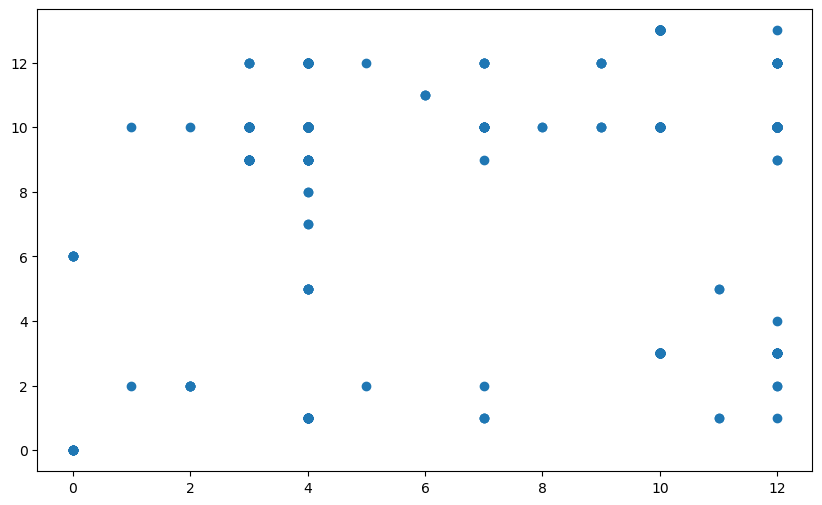

In [676]:
## Find the feature correlation using catter plot on the Front & rear camera
plt.figure(figsize=[10,6])
plt.scatter("FrontCameranum","RearCameranum",data=df)
plt.show()

C:\Users\ABC\anaconda4\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


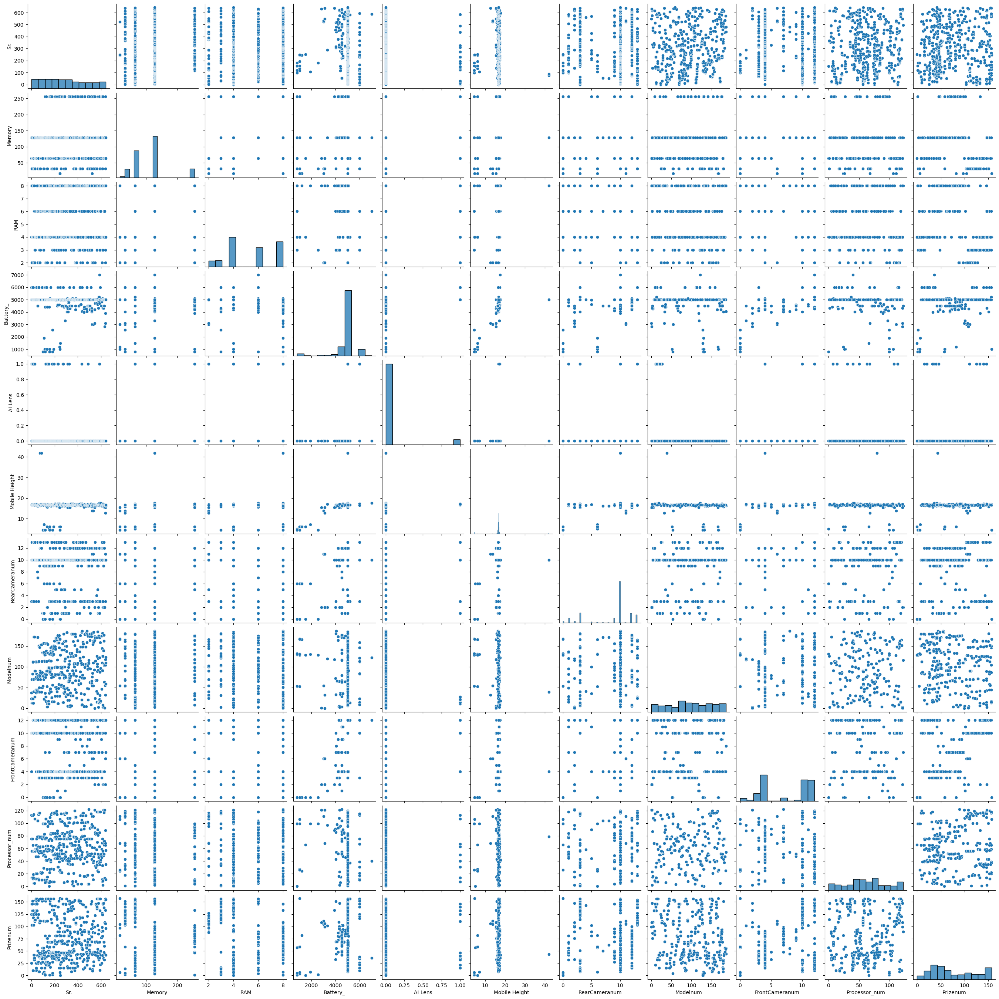

In [50]:
# Pair plot on the whole data set.
sns.pairplot(df)

C:\Users\ABC\anaconda4\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


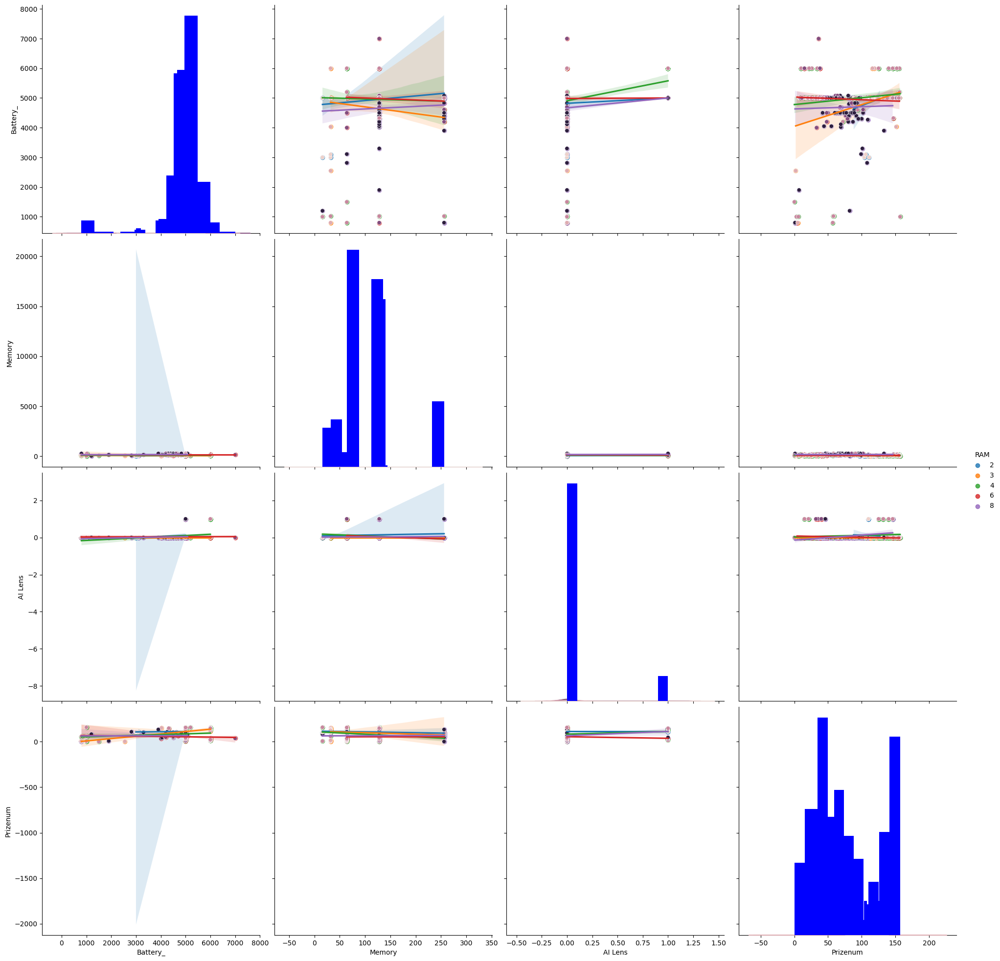

In [311]:
# Pair plot on selected columns to find the correlation betweek these below features.
g=sns.pairplot(df[["Battery_","RAM","Memory","AI Lens","Prizenum"]],hue="RAM",height=5,kind="reg")
g.map_upper(sns.scatterplot,color='red')
g.map_lower(sns.scatterplot, color='green')
g.map_diag(plt.hist, color='blue')

In [ ]:
# Observation :-
#     We have found the battery & mamory most correlation in 5000 to 7000 battri correlate with the Mamory 50 to 250. we can go with this this combination in furter plan.

C:\Users\ABC\anaconda4\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


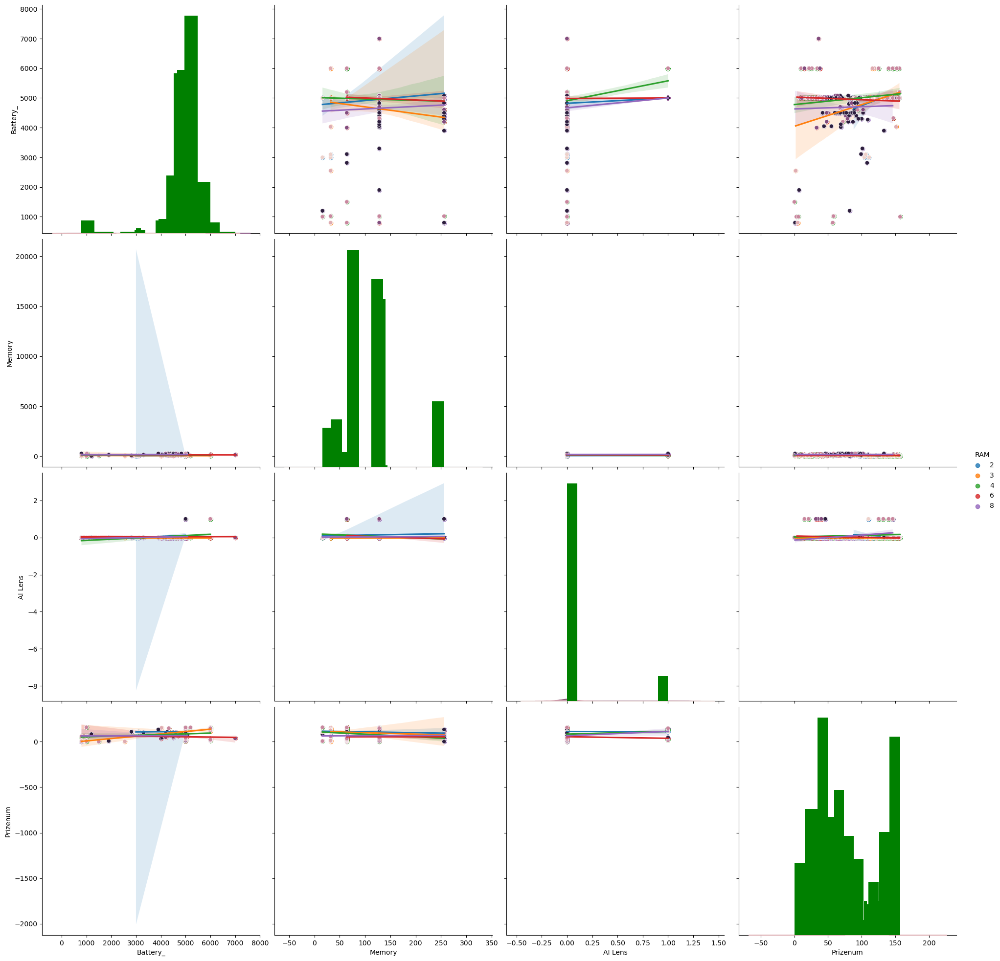

In [533]:
g_1=sns.pairplot(df[["RAM","Memory"]],height=4,kind="reg")
g.map_upper(sns.scatterplot,color='yellow')
g.map_lower(sns.scatterplot, color='red')
g.map_diag(plt.hist, color='green')

C:\Users\ABC\anaconda4\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


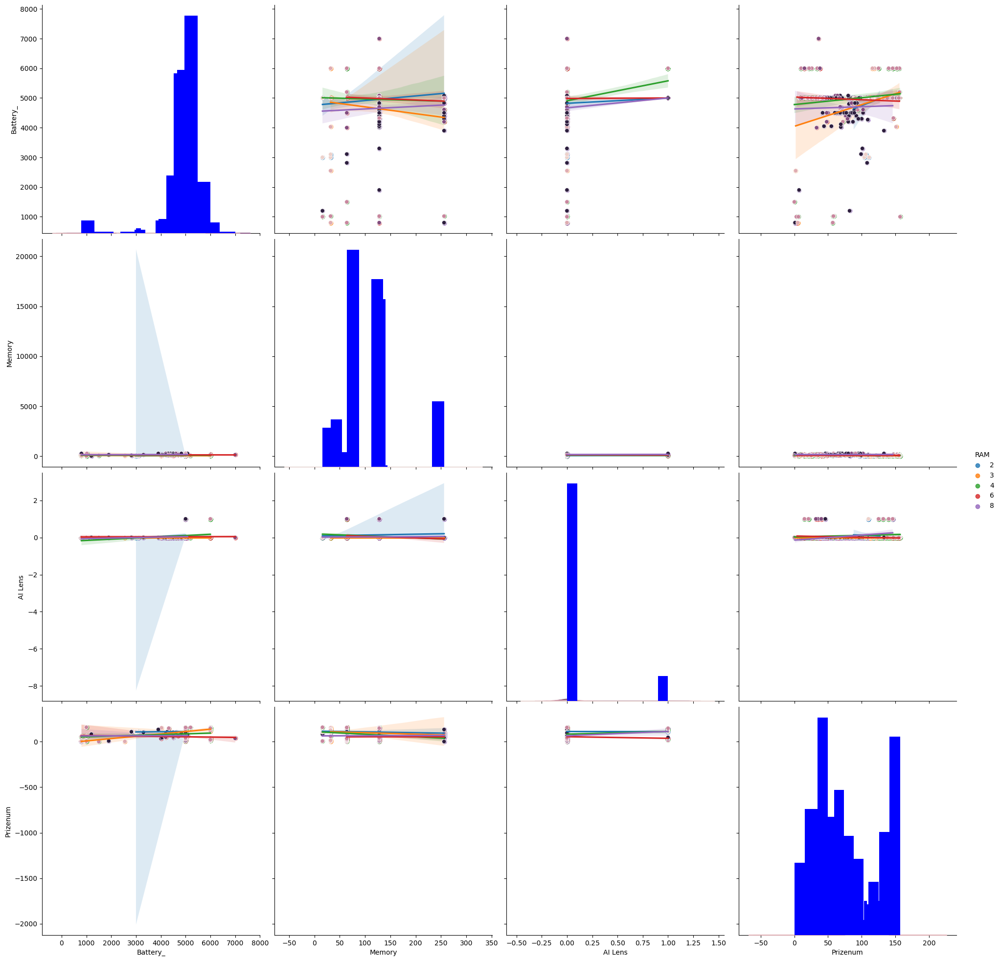

In [531]:
g_2=sns.pairplot(df[["Memory","Prizenum"]],height=4,kind="reg")
g.map_upper(sns.scatterplot,color='red')
g.map_lower(sns.scatterplot, color='green')
g.map_diag(plt.hist, color='blue')

In [54]:
# Import styles from matplotlib 

from matplotlib import style 
  
print(plt.style.available)

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


In [55]:
style

<module 'matplotlib.style' from 'C:\\Users\\ABC\\anaconda4\\Lib\\site-packages\\matplotlib\\style\\__init__.py'>

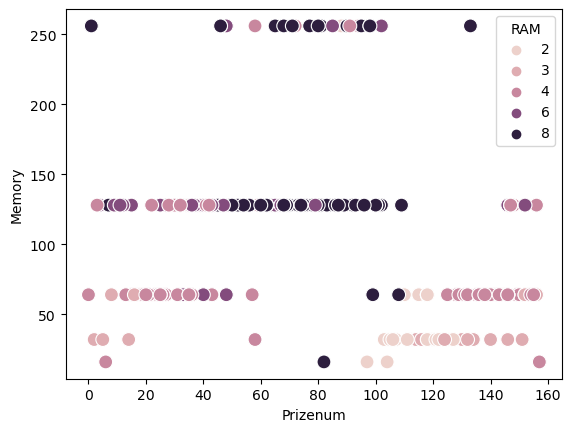

In [56]:
## Scatter plot on the memory & prize to find the correlation

ax=sns.scatterplot(y="Memory",x="Prizenum",data=df,hue="RAM",s=100)

In [57]:
# Obsevation :- 
## There is the two type of the mobile phones sales was very good First is the is the  64 GB & second was the 128 GB mobile phone so in future we should be go with the this 2 mobile phone.

## also 8G RAM corealated 


# Find the outlier using the boxen plot
# Boxplot

In [60]:
df.head()

,Sr.,Model,Colour,Memory,RAM,Battery_,Rear Camera,Front Camera,AI Lens,Mobile Height,Processor_,Prize,RearCameranum,Modelnum,FrontCameranum,Processor_num,Prizenum
0,0,Infinix SMART 7,Night Black,64,4,6000,13MP,5MP,1,16.76,Unisoc Spreadtrum SC9863A1,"7,299",3,23,10,113,125
1,1,Infinix SMART 7,Azure Blue,64,4,6000,13MP,5MP,1,16.76,Unisoc Spreadtrum SC9863A1,"7,299",3,23,10,113,125
2,2,MOTOROLA G32,Mineral Gray,128,8,5000,50MP,16MP,0,16.64,Qualcomm Snapdragon 680,"11,999",10,37,4,75,25
3,3,POCO C50,Royal Blue,32,2,5000,8MP,5MP,0,16.56,Mediatek Helio A22,"5,649",13,69,10,56,103
4,4,Infinix HOT 30i,Marigold,128,8,5000,50MP,5MP,1,16.76,G37,"8,999",10,12,10,14,146


In [534]:
# Pick the rendome values from the data to find the outlier "Front camera & prize"

df[(df['FrontCameranum']>10) | (df['Prize']>100)]

,Sr.,Model,Colour,Memory,RAM,Battery_,Rear Camera,Front Camera,AI Lens,Mobile Height,Processor_,Prize,RearCameranum,Modelnum,FrontCameranum,Processor_num,Prizenum
0,0,Infinix SMART 7,Night Black,64,4,6000,13MP,5MP,1,16.76,Unisoc Spreadtrum SC9863A1,7299,3,23,10,113,125
1,1,Infinix SMART 7,Azure Blue,64,4,6000,13MP,5MP,1,16.76,Unisoc Spreadtrum SC9863A1,7299,3,23,10,113,125
2,2,MOTOROLA G32,Mineral Gray,128,8,5000,50MP,16MP,0,16.64,Qualcomm Snapdragon 680,11999,10,37,4,75,25
3,3,POCO C50,Royal Blue,32,2,5000,8MP,5MP,0,16.56,Mediatek Helio A22,5649,13,69,10,56,103
4,4,Infinix HOT 30i,Marigold,128,8,5000,50MP,5MP,1,16.76,G37,8999,10,12,10,14,146
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
536,637,SAMSUNG Galaxy S23 5G,Cream,256,8,3900,50MP,12MP,0,15.49,Qualcomm Snapdragon 8 Gen 2,79999,10,118,2,89,133
537,638,LAVA Z21,Cyan,32,2,3100,5MP,2MP,0,12.70,Octa Core,5998,11,32,6,68,106
538,639,Tecno Spark 8T,Turquoise Cyan,64,4,5000,50MP,8MP,0,16.76,MediaTek Helio G35,9990,10,123,12,35,155
539,641,SAMSUNG Galaxy A54 5G,Awesome Lime,128,8,5000,50MP,32MP,0,16.26,"Exynos 1380, Octa Core",38999,10,110,7,11,96


In [62]:
df_outliers=df[(df['FrontCameranum']>10) | (df['Prizenum']>100)]

# Boxplot



The meadian is 13499.0


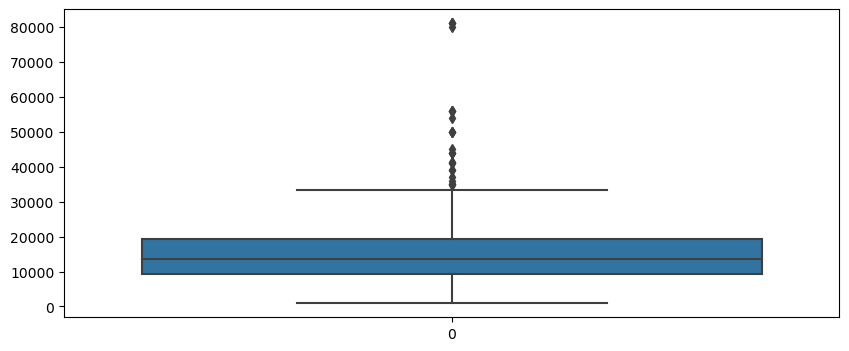

In [701]:
plt.figure(figsize=(10,4))
x=df["Prize"].values
ax=sns.boxplot(x)

print("The meadian is",df["Prize"].median())


The meadian is 9.0


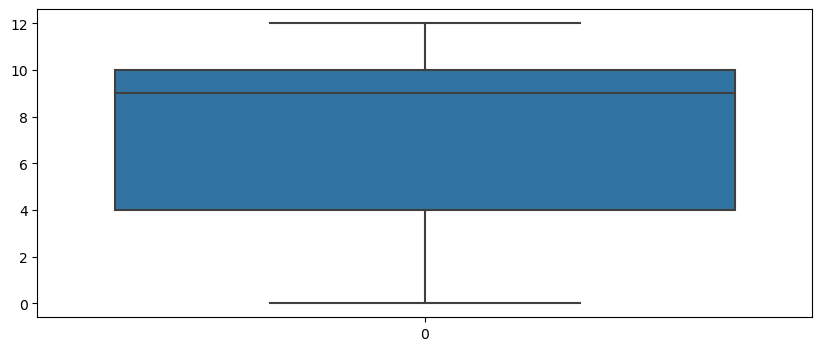

In [704]:
plt.figure(figsize=(10,4))
x=df["FrontCameranum","P"].values
ax=sns.boxplot(x)

print("The meadian is",df["FrontCameranum"].median())


<Axes: xlabel='FrontCameranum', ylabel='Prizenum'>

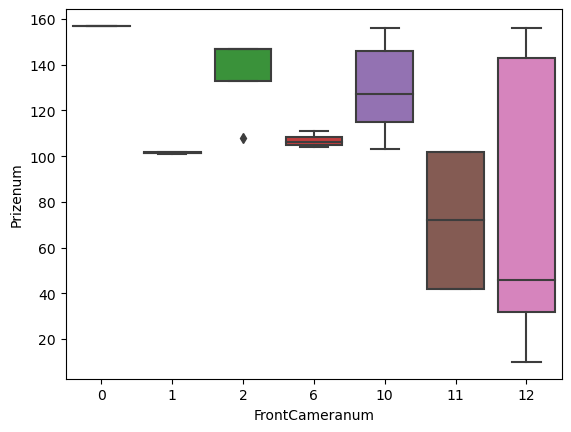

In [321]:
sns.boxplot(data=df_outliers, x="FrontCameranum", y="Prizenum")

In [ ]:
# Observation 
## most of outlier find the front camera "12 front camera"  out lier in the prize is "0 to 40" & "150 to 160".

<Figure size 2000x1500 with 0 Axes>

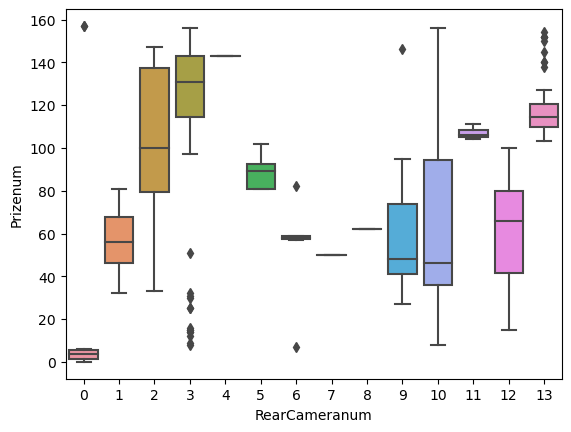

<Figure size 2000x1500 with 0 Axes>

In [319]:
sns.boxplot(data=df,x="RearCameranum", y="Prizenum")
plt.figure(figsize=(20,15))


In [ ]:
## Obsevation
## find the outlier between rear camera & prize as per the above 3 most outlier find "2,10,12" betweek "35 to 80" ,"100 to 160".

<Axes: xlabel='Memory', ylabel='Prizenum'>

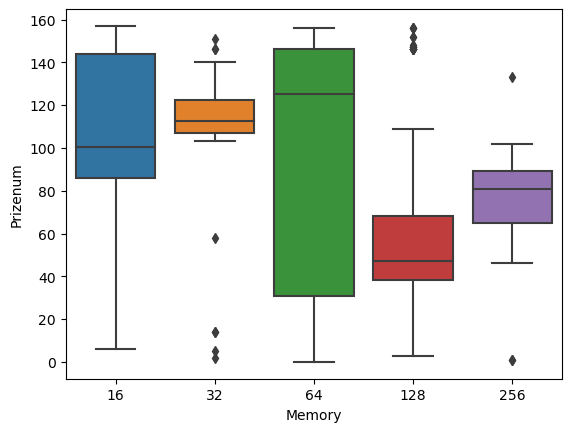

In [66]:
sns.boxplot(data=df,x="Memory", y="Prizenum")

In [537]:
#Observation
    # most out lier find the 16 GB mamori betweek 10 to 85 price

# Distence plot
# Drow distplot on the using mobile price 

C:\Users\ABC\AppData\Local\Temp\ipykernel_14744\1621611043.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x,color="blue")


<Figure size 400x200 with 0 Axes>

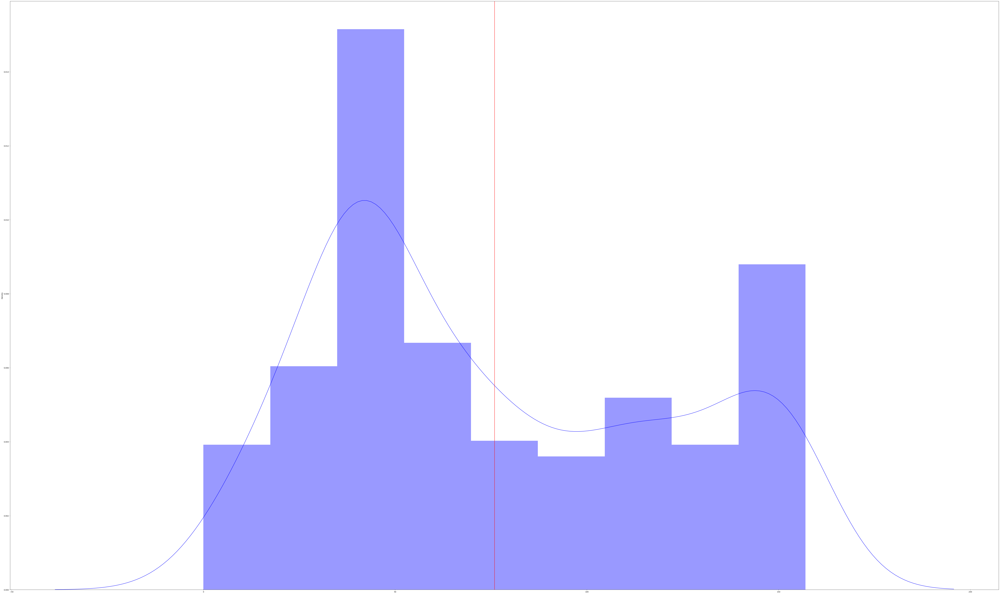

<Figure size 400x200 with 0 Axes>

In [695]:
x=df["Prizenum"].values
sns.distplot(x,color="blue")

# Calculting the mean value 

mean=df["Prizenum"].mean()
plt.axvline(mean,0,1,color='red')

plt.figure(figsize=(4,2))

C:\Users\ABC\AppData\Local\Temp\ipykernel_14744\1412512152.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x,color="green")


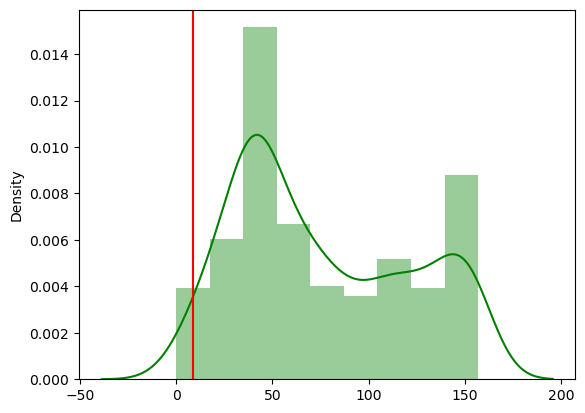

In [69]:
x_2=df["RearCameranum"].values
sns.distplot(x,color="green")
mean=df["RearCameranum"].mean()
plt.axvline(mean,0,1,color='red')

# Task_4: - Model Building:

#### • Split the dataset into training and testing sets.
#### • Develop a machine learning model for price prediction. You can choose algorithms like linear regression, decision trees, or more advanced models like random forests or gradient boosting.

## 4:1 Now we using machine learning to predict model price through "Linear regrasion & decision tree.

In [539]:
df.shape

(541, 17)

In [342]:
# select data in defrent variable to check the correlation

df.iloc[:,[3,4,5,11,12,13,14,15]].quantile()

Memory              128.0
RAM                   6.0
Battery_           5000.0
Prize             13499.0
RearCameranum        10.0
Modelnum             98.0
FrontCameranum        9.0
Processor_num        59.0
Name: 0.5, dtype: Float64

In [341]:
df_corr=df.iloc[:,[3,4,5,11,12,13,14,15]]

In [343]:
df_corr.head()

,Memory,RAM,Battery_,Prize,RearCameranum,Modelnum,FrontCameranum,Processor_num
0,64,4,6000,7299,3,23,10,113
1,64,4,6000,7299,3,23,10,113
2,128,8,5000,11999,10,37,4,75
3,32,2,5000,5649,13,69,10,56
4,128,8,5000,8999,10,12,10,14


In [344]:
df_corr.corr().round(2)

,Memory,RAM,Battery_,Prize,RearCameranum,Modelnum,FrontCameranum,Processor_num
Memory,1.00,0.63,-0.05,0.57,-0.02,0.04,-0.38,-0.15
RAM,0.63,1.00,-0.10,0.53,-0.02,0.01,-0.44,-0.11
Battery_,-0.05,-0.10,1.00,-0.03,0.26,-0.09,0.41,-0.14
Prize,0.57,0.53,-0.03,1.00,-0.02,-0.08,-0.33,-0.05
RearCameranum,-0.02,-0.02,0.26,-0.02,1.00,0.05,0.11,-0.03
Modelnum,0.04,0.01,-0.09,-0.08,0.05,1.00,-0.08,0.04
FrontCameranum,-0.38,-0.44,0.41,-0.33,0.11,-0.08,1.00,-0.12
Processor_num,-0.15,-0.11,-0.14,-0.05,-0.03,0.04,-0.12,1.00


## 4:2 Drow heatmap to show most correlation between above select varibale

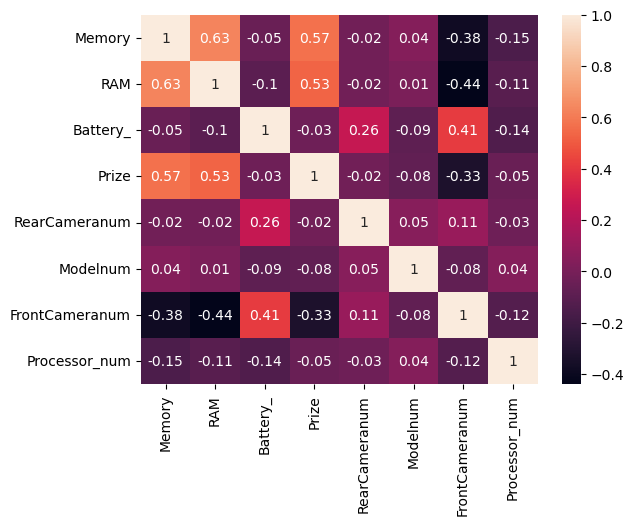

<Figure size 1200x1000 with 0 Axes>

In [345]:
sns.heatmap(df_corr.corr().round(2),annot=True,vmax=1)
plt.figure(figsize=(12,10))
plt.show()

In [ ]:
## Observation:- 
## Most correlatoin is 1 one which is uniq & "RAM & Mamory" which is 2nd best than "Memory & price" is the best correlation

# 4:3 Heatmap with Matrix 
## Find the correlation with Matrix


In [346]:
matrix=df_corr.corr().round(2)
mask=np.triu(np.ones_like(matrix,dtype=bool))
mask

array([[ True,  True,  True,  True,  True,  True,  True,  True],
       [False,  True,  True,  True,  True,  True,  True,  True],
       [False, False,  True,  True,  True,  True,  True,  True],
       [False, False, False,  True,  True,  True,  True,  True],
       [False, False, False, False,  True,  True,  True,  True],
       [False, False, False, False, False,  True,  True,  True],
       [False, False, False, False, False, False,  True,  True],
       [False, False, False, False, False, False, False,  True]])

<function matplotlib.pyplot.show(close=None, block=None)>

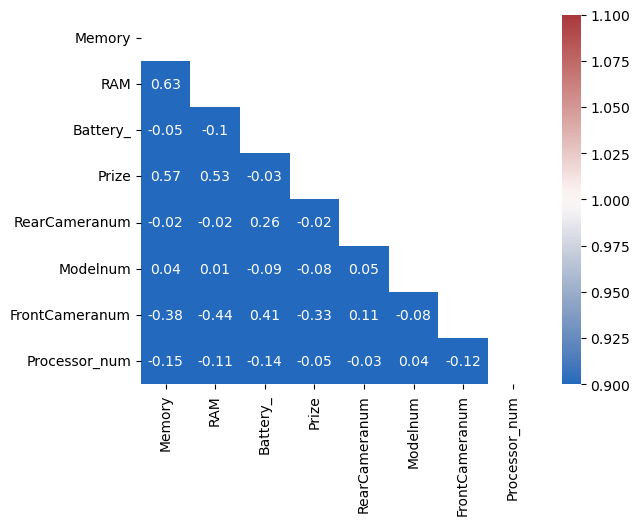

<Figure size 1200x1000 with 0 Axes>

In [347]:
sns.heatmap(matrix,annot=True,vmax=1,vmin=1,cmap='vlag',mask=mask)
plt.figure(figsize=(12,10))
plt.show

In [348]:
## Using matrix unstack to show best correlation on the variable wise or column wise without drow visulization "Plot"

matrix=matrix.unstack()
matrix[matrix >= 0]

Memory          Memory            1.00
                RAM               0.63
                Prize             0.57
                Modelnum          0.04
RAM             Memory            0.63
                RAM               1.00
                Prize             0.53
                Modelnum          0.01
Battery_        Battery_          1.00
                RearCameranum     0.26
                FrontCameranum    0.41
Prize           Memory            0.57
                RAM               0.53
                Prize             1.00
RearCameranum   Battery_          0.26
                RearCameranum     1.00
                Modelnum          0.05
                FrontCameranum    0.11
Modelnum        Memory            0.04
                RAM               0.01
                RearCameranum     0.05
                Modelnum          1.00
                Processor_num     0.04
FrontCameranum  Battery_          0.41
                RearCameranum     0.11
                FrontCame

In [540]:
## Observation
    
    ## Best corrlation with Mamory & model 4-4 column correlate  which is good in compare with others.

<Axes: xlabel='Prize', ylabel='Prize'>

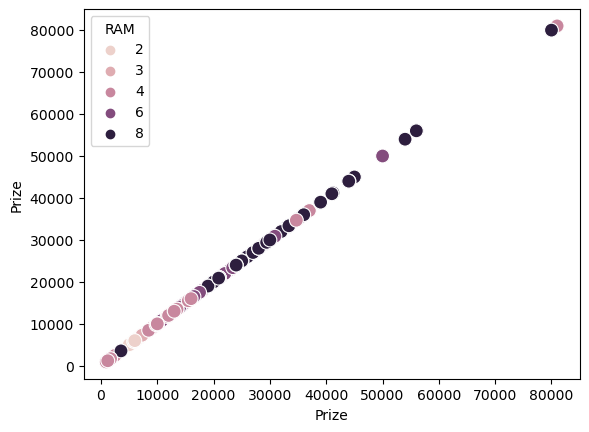

In [350]:
sns.scatterplot(y="Prize",x="Prize",data=df_corr,hue="RAM",s=100)

# T 4:5 linear regression

### Feature selection for find the linear regression score for "y" test

In [724]:
# Select feature for x & y variable 

x=df.iloc[:,[3,4,5,8,12,14]]
y=df.iloc[:,[11]]

In [725]:
x.head(2)

,Memory,RAM,Battery_,AI Lens,RearCameranum,FrontCameranum
0,64,4,6000,1,3,10
1,64,4,6000,1,3,10


In [726]:
y.head(2)

,Prize
0,7299
1,7299


In [727]:
# Import train & test from the Sklearn model
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=2)

In [728]:
x_train.shape

(432, 6)

In [729]:
y_train.shape

(432, 1)

In [730]:
x_test.shape

(109, 6)

In [731]:
y_test.shape

(109, 1)

In [359]:
from sklearn.linear_model import LinearRegression
import numpy as np

In [732]:
lr= LinearRegression()

In [733]:
lr.fit(x_train,y_train)

LinearRegression()

In [734]:
lr.score(x_test,y_test)

0.4780367858872233

In [541]:
## linar regrasion score is 0.0.4705157780585738

In [735]:
#linar regrasion correlation
lr.coef_

array([[ 6.62820507e+01,  1.50559822e+03,  9.17382475e-01,
        -3.94787430e+03, -1.04935897e+02, -1.98321567e+02]])

Text(0, 0.5, 'Mobile price')

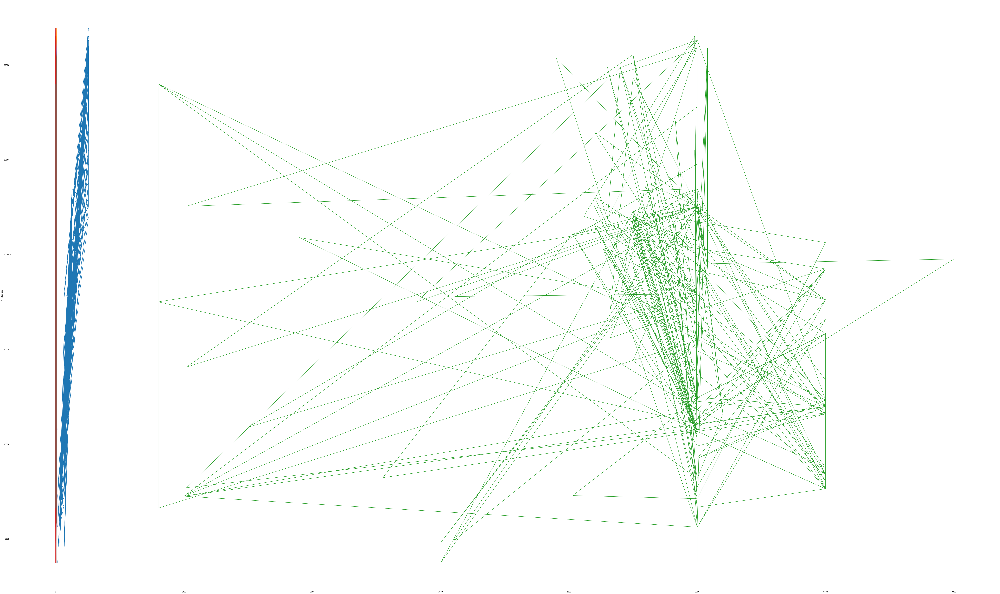

In [736]:
# Drow plot on the x train data 

plt.plot(x_train,lr.predict(x_train))
plt.xlabel('')
plt.ylabel('Mobile price')

In [373]:
lr.predict(x_test)

array([[16825.98712308],
       [ 8444.07879219],
       [25040.8234708 ],
       [ 7353.42539162],
       [15589.2427377 ],
       [14744.21579078],
       [ 8611.38442477],
       [21593.77412782],
       [18600.24827982],
       [31926.61700718],
       [13123.96700175],
       [21744.58606803],
       [13437.45684787],
       [17490.62795877],
       [14000.60282481],
       [20843.81381616],
       [23036.58636906],
       [15796.20245721],
       [19448.74364456],
       [29194.39350439],
       [18917.9999375 ],
       [22693.50944961],
       [19011.76867716],
       [32227.42171954],
       [10462.8389578 ],
       [17185.36111727],
       [20397.3479464 ],
       [27487.19436893],
       [ 9777.01558076],
       [ 9901.63017842],
       [19526.59748506],
       [23036.58636906],
       [24192.51904102],
       [18600.24827982],
       [31411.76978919],
       [20237.30317845],
       [20397.3479464 ],
       [17608.00290331],
       [19079.62596306],
       [19834.22265357],


In [737]:
# Creat ytest prediction value

y_predict=lr.predict(x_test)

In [738]:
y_predict

array([[19366.47541135],
       [ 8309.23697433],
       [22521.55539479],
       [ 8175.10930905],
       [15562.48465839],
       [16564.52373968],
       [10670.53873864],
       [22396.45706343],
       [17923.78642271],
       [31308.91535335],
       [16043.78439843],
       [19708.68052499],
       [15309.23311983],
       [17614.86656337],
       [13975.91212302],
       [20454.78203056],
       [22311.68360091],
       [14992.09084425],
       [19054.98083515],
       [30546.96665194],
       [18028.72231965],
       [22478.40041454],
       [20454.78203056],
       [31950.08096197],
       [12257.11127401],
       [19510.35895807],
       [20626.06300009],
       [28002.20666228],
       [11801.73315108],
       [10670.53873864],
       [19708.68052499],
       [22311.68360091],
       [22521.55539479],
       [17923.78642271],
       [30869.17669361],
       [18973.12712245],
       [20626.06300009],
       [19510.35895807],
       [20454.78203056],
       [19708.68052499],


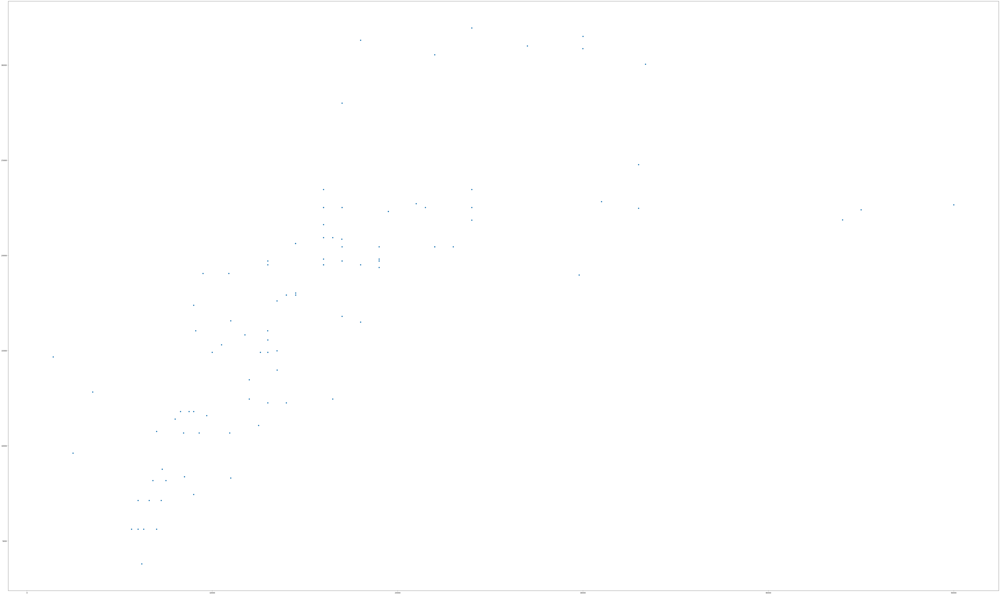

In [739]:
# draw plot on the y test prediction value
plt.scatter(y_test,y_predict)

In [ ]:
## 

# T:4:6 | Decision Tree

In [740]:
#import decision tree from sklearn
from sklearn.tree import DecisionTreeClassifier

In [741]:
clf=DecisionTreeClassifier(max_depth=3)

In [742]:
clf.fit(x_train,y_train)

DecisionTreeClassifier(max_depth=3)

In [794]:
y_predict=clf.predict(x_test)

In [795]:
y_predict

array([23999.,  9999., 15999.,  9999., 15999., 15999.,  9999., 23999.,
       15999., 29999., 15999., 15999., 15999., 15999., 15999., 15999.,
       15999.,  9999., 15999., 29999., 15999., 29999., 15999., 29999.,
        9999., 15999., 15999., 29999.,  9999.,  9999., 15999., 15999.,
       15999., 15999., 29999., 23999., 15999., 15999., 15999., 15999.,
        9999.,  9999., 15999., 15999.,  8999., 15999., 15999., 15999.,
        8999., 15999., 15999., 15999., 15999., 23999.,  6999.,  9999.,
       15999.,  6999., 15999., 29999.,  6999.,  6999.,  6199.,  9999.,
       15999.,  9999., 15999., 15999.,  9999., 15999.,  9999., 15999.,
       15999., 29999., 15999., 23999.,  9999., 23999., 23999., 29999.,
       23999.,  8999., 15999., 15999., 29999., 15999.,  6999., 15999.,
        9999., 15999.,  8999.,  9999., 15999.,  6999., 15999., 15999.,
       15999.,  9999., 23999., 15999.,  6999.,  9999., 15999.,  6999.,
       15999.,  8999.,  9999., 15999., 15999.])

In [745]:
from sklearn.metrics import accuracy_score

In [748]:
accuracy_score(y_test,y_predict)

0.11926605504587157

In [749]:
from sklearn.tree import plot_tree
from matplotlib.pylab import rcParams

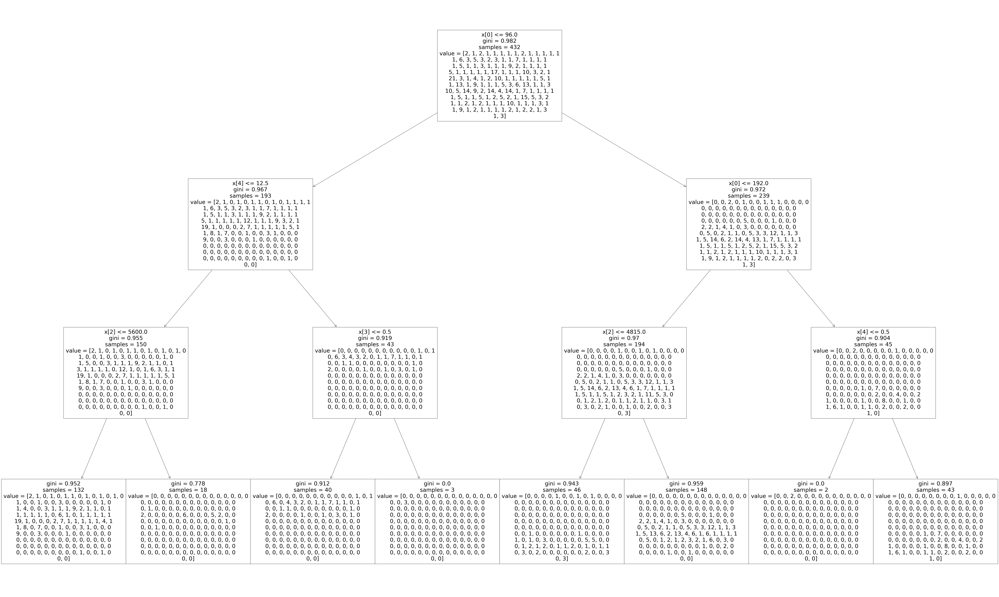

In [750]:
rcParams['figure.figsize']=100,60
plot_tree(clf)
plt.show()

In [ ]:
# Observation 
# on the left side of tree are most related & right side related but less in compare of left

# T 4:7  | Rendom forest Decision tree

## on the Rendome value r2 score increase with 0.423 which is not good. 

In [ ]:
# Rendome Forest

In [752]:
def sample_rows(df,percent):
    return df.sample(int(percent*df.shape[0]),replace=True)

In [753]:
def sample_features(df,percent):
    cols==random.sample(df.columns.tolist()[:-1],int(percent*df.shape[1]))
    return[df.cols]

In [754]:
def combined_sampling(df,row_percent,col_percent):
    new_df=sample_rows(df,row_percent)
    return sample.cols(df,cols_percent)


In [756]:
df_1=sample_rows(df,0.2)

In [757]:
df_2=sample_rows(df,0.2)

In [758]:
df_3=sample_rows(df,0.2)

In [759]:
from sklearn.tree import DecisionTreeClassifier
rf_1=DecisionTreeClassifier(max_depth=3)
rf_2=DecisionTreeClassifier(max_depth=3)
rf_3=DecisionTreeClassifier(max_depth=3)

In [760]:
rf_1.fit(df_1.iloc[:,12:15],df_1.iloc[:,11])
rf_2.fit(df_2.iloc[:,12:15],df_2.iloc[:,11])
rf_3.fit(df_3.iloc[:,12:15],df_3.iloc[:,11])


DecisionTreeClassifier(max_depth=3)

In [620]:
from sklearn.tree import plot_tree

[Text(0.5, 0.875, 'x[2] <= 9.5\ngini = 0.968\nsamples = 108\nvalue = [1, 1, 1, 2, 1, 1, 2, 1, 2, 2, 1, 1, 1, 1\n2, 1, 4, 1, 4, 6, 1, 1, 1, 1, 3, 1, 3, 5\n2, 2, 1, 1, 1, 4, 8, 4, 1, 3, 2, 1, 1, 1\n2, 8, 1, 1, 1, 2, 4, 1, 1, 1, 1, 1]'),
 Text(0.25, 0.625, 'x[1] <= 133.5\ngini = 0.947\nsamples = 54\nvalue = [1, 1, 1, 2, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0\n0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0\n0, 1, 1, 1, 1, 2, 4, 3, 1, 3, 2, 1, 1, 1\n2, 8, 1, 1, 1, 2, 4, 1, 1, 1, 1, 0]'),
 Text(0.125, 0.375, 'x[0] <= 7.5\ngini = 0.946\nsamples = 33\nvalue = [0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0\n0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0\n0, 1, 0, 1, 0, 2, 4, 2, 1, 2, 2, 1, 1, 1\n2, 2, 0, 1, 1, 0, 2, 0, 1, 0, 1, 0]'),
 Text(0.0625, 0.125, 'gini = 0.864\nsamples = 9\nvalue = [0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0\n0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0\n0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0\n2, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]'),
 Text(0.1875, 0.125, 'gini = 0.924\nsamples = 24\nvalue = [0, 0, 0, 0

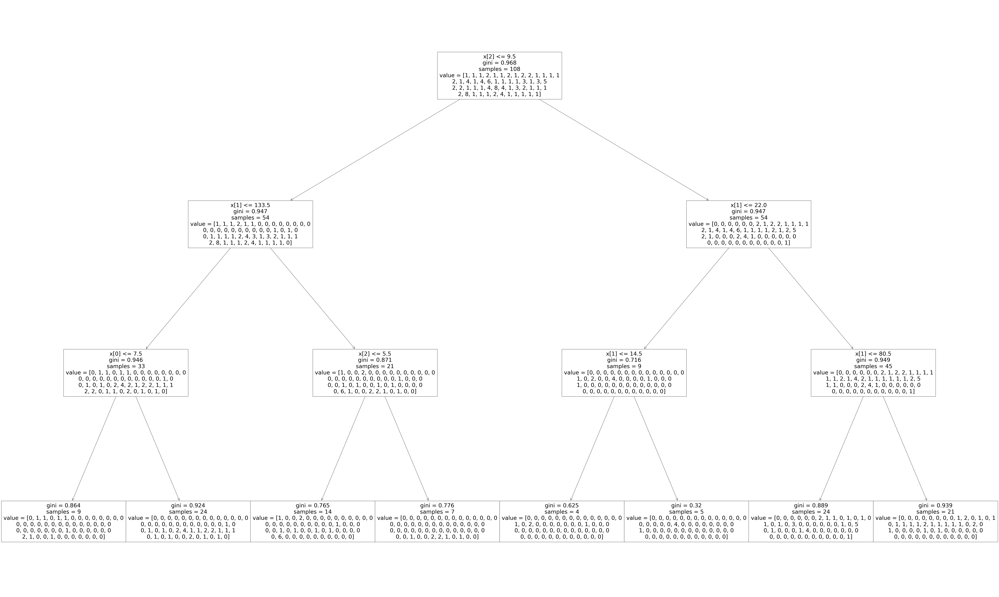

In [761]:
plot_tree(rf_1)

[Text(0.5, 0.875, 'x[2] <= 11.0\ngini = 0.975\nsamples = 108\nvalue = [1, 1, 1, 1, 2, 1, 2, 2, 1, 1, 1, 1, 2, 1\n1, 2, 3, 2, 5, 1, 1, 1, 1, 1, 1, 2, 4, 1\n1, 1, 5, 2, 6, 3, 2, 1, 2, 1, 6, 4, 1, 2\n1, 1, 1, 4, 2, 3, 1, 1, 2, 1, 1, 1, 2, 1\n2, 1, 2]'),
 Text(0.25, 0.625, 'x[2] <= 5.5\ngini = 0.971\nsamples = 83\nvalue = [1, 1, 1, 1, 2, 1, 2, 2, 1, 1, 0, 1, 1, 0\n1, 2, 3, 0, 0, 1, 0, 1, 0, 1, 0, 0, 3, 1\n1, 1, 4, 2, 2, 3, 1, 1, 2, 0, 6, 4, 1, 2\n1, 1, 1, 4, 2, 3, 1, 1, 2, 1, 1, 1, 2, 1\n2, 1, 0]'),
 Text(0.125, 0.375, 'x[1] <= 91.5\ngini = 0.947\nsamples = 52\nvalue = [1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0\n0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1\n1, 1, 4, 2, 2, 3, 1, 0, 2, 0, 6, 4, 0, 2\n1, 0, 1, 4, 2, 3, 1, 0, 2, 1, 1, 1, 2, 0\n0, 0, 0]'),
 Text(0.0625, 0.125, 'gini = 0.888\nsamples = 22\nvalue = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0\n0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0\n0, 0, 4, 0, 0, 2, 1, 0, 1, 0, 2, 0, 0, 2\n0, 0, 0, 4, 0, 2, 0, 0, 0, 1, 1, 0, 1, 0\n0, 0, 0]'),
 Text(0.

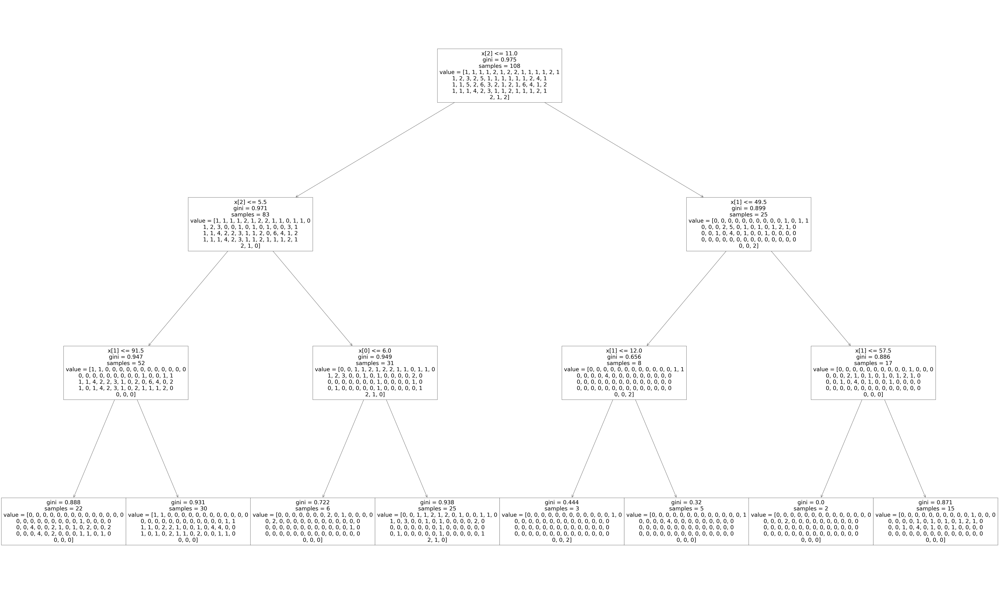

In [762]:
plot_tree(rf_2)

[Text(0.5, 0.875, 'x[2] <= 9.5\ngini = 0.973\nsamples = 108\nvalue = [1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 3, 1, 1\n1, 1, 1, 1, 1, 6, 2, 1, 4, 1, 3, 1, 1, 2\n1, 6, 4, 1, 1, 1, 1, 2, 3, 1, 4, 4, 4, 1\n4, 1, 3, 2, 1, 1, 1, 1, 1, 1, 1, 1, 5, 2\n4, 1]'),
 Text(0.25, 0.625, 'x[2] <= 6.5\ngini = 0.952\nsamples = 52\nvalue = [1, 2, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0\n0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1\n1, 3, 1, 0, 0, 0, 1, 1, 0, 0, 2, 2, 4, 1\n4, 0, 3, 2, 1, 1, 1, 1, 1, 1, 1, 0, 5, 2\n4, 1]'),
 Text(0.125, 0.375, 'x[0] <= 3.0\ngini = 0.951\nsamples = 43\nvalue = [1, 2, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0\n0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1\n1, 3, 1, 0, 0, 0, 1, 1, 0, 0, 2, 2, 4, 1\n4, 0, 3, 2, 1, 1, 1, 0, 1, 1, 0, 0, 0, 2\n2, 1]'),
 Text(0.0625, 0.125, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0\n0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0\n0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0\n2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0\n0, 0]'),
 Text(0.1875, 0.125, 'gin

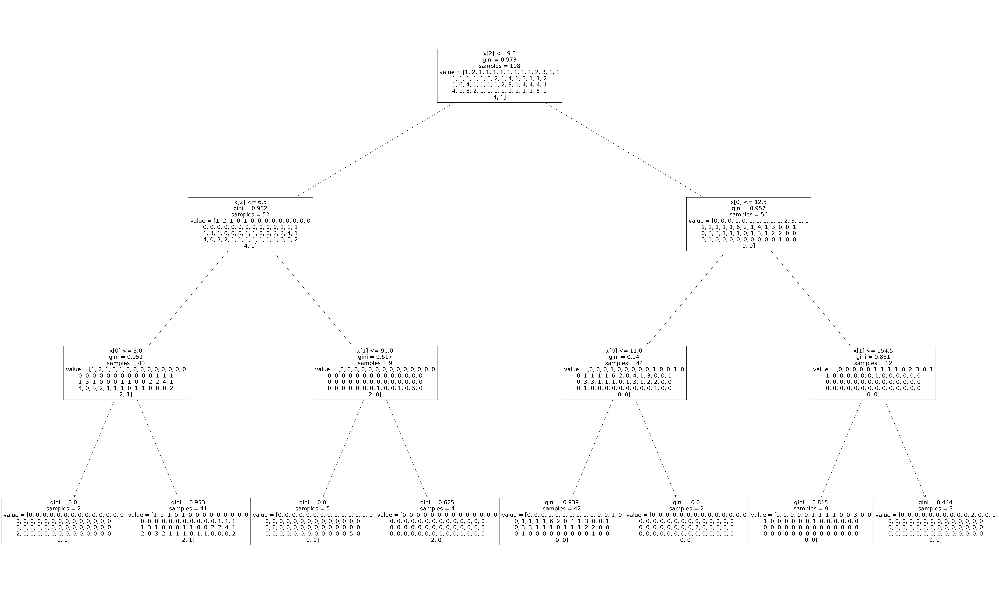

In [624]:
plot_tree(rf_3)

# Task:- 5 Model Evaluation:

### Evaluate the model's performance using appropriate metrics (e.g., mean absolute error, root mean squared error) to assess how accurately it predicts mobile phone prices. 


## T:5:1 MAE | MSE | R2S

In [763]:
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score

In [764]:
print("MAE",mean_absolute_error(y_test,y_predict))

MAE 3757.394495412844


In [765]:
print("MSE",mean_squared_error(y_test,y_predict))

MSE 35682282.34862386


In [766]:
print("RMSE",np.sqrt(mean_squared_error(y_test,y_predict)))

RMSE 5973.464852882609


In [767]:
print("R2S",r2_score(y_test,y_predict))

# Make 1 variable for find the adjusted r2 score.
r2=r2_score(y_test,y_predict)

R2S 0.5055919787885148


In [768]:
# Adjusted r2 score

1-((1-r2)*(109-1)/(109-1-8))

0.46603933709159595

In [ ]:
## observation 
# MAE score of predict valur & test value is 4217.5658 
# MSE score of predict valur & test value is 38213792.44648973
# RMSE score of predict valur & test value is 6181.730538165646

# and r2 score is 0.4705157780585738 & adjucted score quite improved 0.42815704030325974 

## T 4:2 MSE,MAE Predict on the rendome value

### MSE,MAE and R2 score calculate on the Rendome Value to adust the R2 score for 

In [770]:
# Now we calculate MSE MAE value on the rendome value
df_random=df.copy()
df_random["random_features"]= np.random.random(541)
df_random.shape

(541, 18)

Text(0, 0.5, 'random_features')

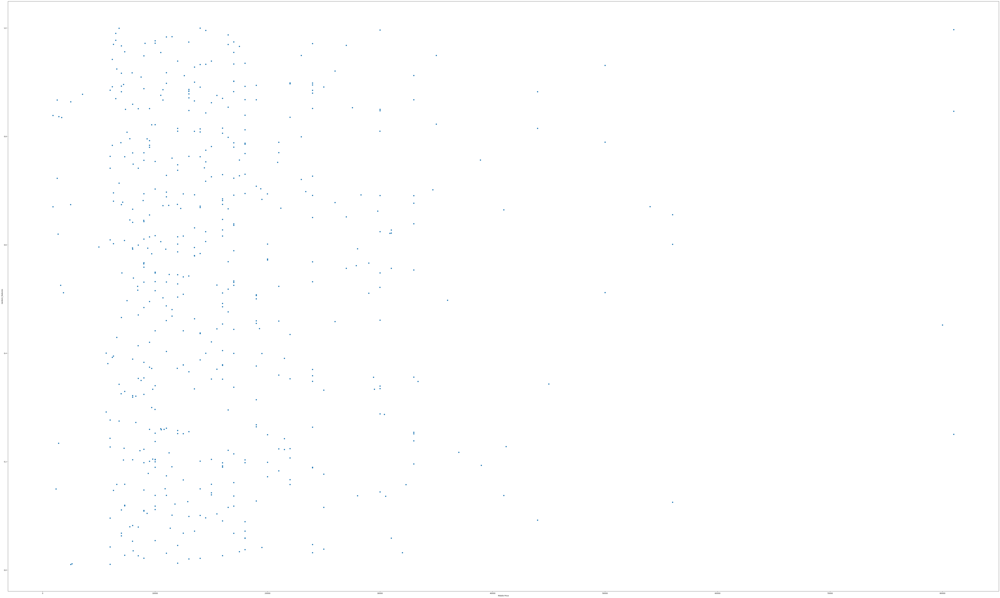

In [771]:
plt.scatter(df_random["Prize"],df_random["random_features"])
plt.xlabel("Mobile Price")
plt.ylabel("random_features")


In [787]:
x1=df_random.iloc[:,[3,4,5,8,12,14]]
y1=df_random.iloc[:,[11]]


In [788]:
x1_train,x1_test,y1_train,y1_test=train_test_split(x1,y1,test_size=0.2,random_state=2)

In [789]:
lr= LinearRegression()

In [790]:
lr.fit(x1_train,y1_train)

LinearRegression()

In [488]:
y1_pred=lr.predict(x1_test)

In [791]:
lr.score(x1_test,y1_test)

0.4780367858872233

In [792]:
r2=r2_score(y1_test,y1_pred)
r2

0.5123272554431855

In [793]:

1-((1-r2)*(109-1)/(109-1-10))

0.4625647304884085

In [ ]:
# Observation 
# on the Rendome value r2 score increase with 0.423 which is not good. 

# T 5:4 :- Final price prediction :
### Now Pridict the final price of mobile on the rendome value which we will pick from the above prediction.

In [707]:
# select top value of the eatch feature for pridict final value of mobile
from joblib import dump, load
dump(lr,"Final_price.joblib")
from sklearn.tree import DecisionTreeRegressor

In [799]:
Mobile=([[128,8,5000,1,10,4]])

In [798]:
lr.predict(Mobile)

C:\Users\ABC\anaconda4\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([[18573.68109511]])

# Final Observation

### Now finally we have predict final mobile phone price "18573" as per the above taken the samples 